In [ ]:
import numpy as np

In [ ]:
!wget -O dog-breed-identification.zip "https://www.dropbox.com/s/9kjr0ui9qbodfao/dog-breed-identification.zip?dl=1" # download the zip file, ensuring it's saved as a zip file
#using the -O flag to explicitly specify the output file name and adding "?dl=1" to force a direct download from Dropbox.

import os
import zipfile

local_zip = 'dog-breed-identification.zip'
zip_ref = zipfile.ZipFile(local_zip, 'r')

zip_ref.extractall('Dog Vision') # unzip the files into a file called "Dog Vision"
zip_ref.close()

--2024-11-05 06:50:19--  https://www.dropbox.com/s/9kjr0ui9qbodfao/dog-breed-identification.zip?dl=1
Resolving www.dropbox.com (www.dropbox.com)... 162.125.2.18, 2620:100:6017:18::a27d:212
Connecting to www.dropbox.com (www.dropbox.com)|162.125.2.18|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://www.dropbox.com/scl/fi/pjrulzwpa2osmtcl34j5c/dog-breed-identification.zip?rlkey=illavzwa19vysrolwpgqov86a&dl=1 [following]
--2024-11-05 06:50:19--  https://www.dropbox.com/scl/fi/pjrulzwpa2osmtcl34j5c/dog-breed-identification.zip?rlkey=illavzwa19vysrolwpgqov86a&dl=1
Reusing existing connection to www.dropbox.com:443.
HTTP request sent, awaiting response... 302 Found
Location: https://uc37a6f67fe550d587f000e7ca74.dl.dropboxusercontent.com/cd/0/inline/CdwpJlWQBGi1T6vaAb65ggLoTJrv3hcR4Qd_j7gDdNo28LJovN0hvC8xGXmH9BU1SVUV7KpuiDXpPxj-e-iEuu543uDkPGGTTq-5N5-_p9jztQQ2a5p40z4nCuWxcrBXxYzug7Dn1qes2HtliutEefhT/file?dl=1# [following]
--2024-11-05 06:50:20--  https://

## End To End Multi-class Dog Breed Classification

This notebook builds an end to end multi-class image classifier using tensorflow 2.0 and tensorflow hub.

## 1. Problem

Identifying the breed of a dog given an image of a dog.

When I'm sitting at the cafe and I take a photo of a dog, I want to know what breed of dog it is.

## 2. Data

The data we're using is from Kaggle's dog breed identification competition.

https://www.kaggle.com/c/dog-breed-identification/data

## 3. Evaluation

The evaluation is a file with prediction probabilities for each dog breed of each test image.

https://www.kaggle.com/c/dog-breed-identification/overview/evaluation

## 4. Features

Some information about the data:
* We're dealing with images (unstructured data) so it's probably best we use deep learning/transfer learning.
* There are 120 breeds of dogs (this means there are 120 different classes).
* There are around 10,000+ images in the training set (these images have labels).
* There are around 10,000+ images in the test set (these images have no labels, because we'll want to predict them).



In [ ]:
import tensorflow as tf
print("TF version", tf.__version__)

import tensorflow_hub as hub
print("TF Hub version:", hub.__version__)

TF version 2.17.0
TF Hub version: 0.16.1


In [ ]:
# Check for GPU availability
print("GPU", "available (YESSSS!!!!!)" if tf.config.list_physical_devices("GPU") else "not available :(")

GPU available (YESSSS!!!!!)


## Getting our data ready(Turning them into tensors)

Our data has to be in form of numerical format in all our machine learning mdels

In [ ]:
#check out the labels
import pandas as pd
labels_csv=pd.read_csv("/content/Dog Vision/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     fff43b07992508bc822f33d8ffd902ae  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


<Axes: xlabel='breed'>

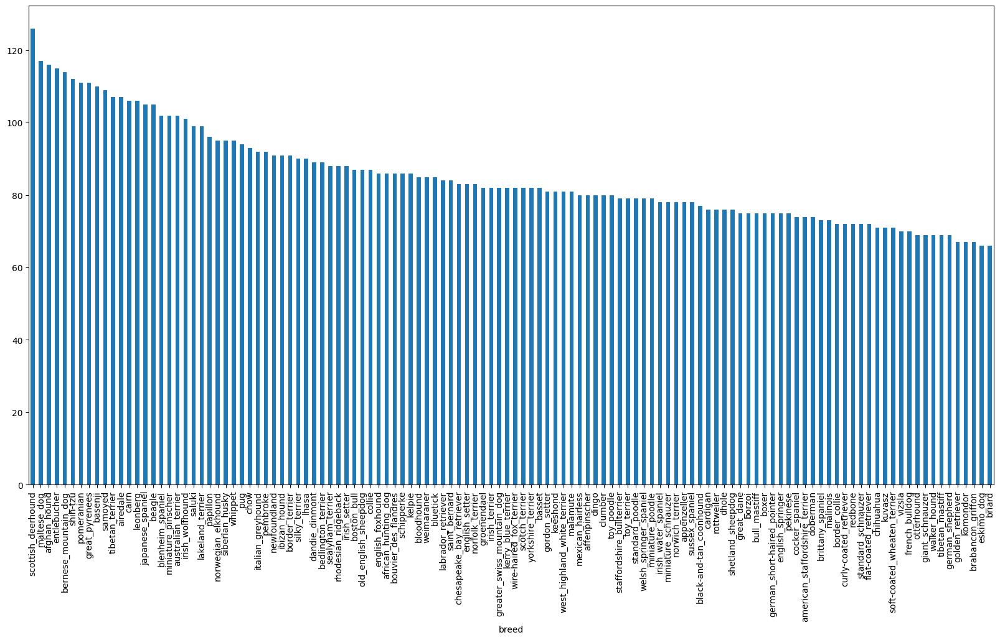

In [ ]:
#how many images are ther per breed
labels_csv["breed"].value_counts().plot.bar(figsize=(20,10))

In [ ]:
labels_csv["breed"].value_counts()["komondor"]

67

In [ ]:
labels_csv["breed"].value_counts().median()

82.0

In [ ]:
from Ipython.display import Image

ModuleNotFoundError: No module named 'Ipython'

In [78]:
pip install Ipython

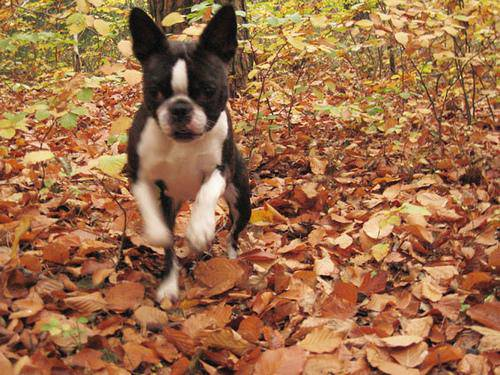

In [79]:
from IPython.display import Image
Image("/content/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg")

## Getting Images and their Labels

Let's get a list of all our images

In [80]:
# Create pathnames from image ID's
filenames = ["/content/Dog Vision/train/" + fname + ".jpg" for fname in labels_csv["id"]]

# Check the first 10
filenames[:10]

['/content/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '/content/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 '/content/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '/content/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 '/content/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 '/content/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [81]:
# Check whether number of filenames matches number of actual image files
import os
if len(os.listdir("/content/Dog Vision/train/")) == len(filenames):
  print("Filenames match actual amount of files!!! Proceed.")
else:
  print("Filenames do no match actual amount of files, check the target directory.")

Filenames match actual amount of files!!! Proceed.


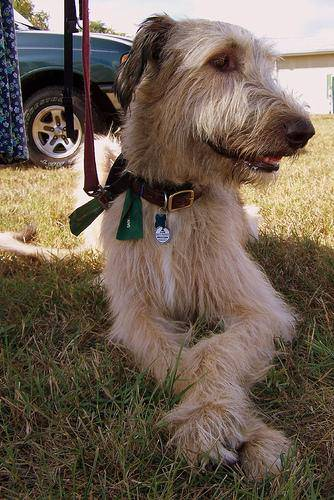

In [82]:
Image(filenames[9500])

In [83]:
labels_csv["breed"][9500]

'irish_wolfhound'

In [84]:
labels_csv["breed"]

,breed
0,boston_bull
1,dingo
2,pekinese
3,bluetick
4,golden_retriever
...,...
10217,borzoi
10218,dandie_dinmont
10219,airedale
10220,miniature_pinscher


In [85]:
labels = labels_csv["breed"].to_numpy()
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [86]:
len(labels)

10222

In [87]:
# See if number of labels matches the number of filenames
if len(labels) == len(filenames):
  print("Number of labels matches number of filenames!")
else:
  print("Number of labels does not match number of filenames, check data directories!")

Number of labels matches number of filenames!


In [88]:
import numpy as np

unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [89]:
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [90]:
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [91]:
print(labels[1])
labels[1] == unique_breeds

dingo


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [92]:
# Turn every label into a boolean array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [93]:
# Example: Turning boolean array into integers
print(labels[0]) # original label
print(np.where(unique_breeds == labels[0])) # index where label occurs
print(boolean_labels[0].argmax()) # index where label occurs in boolean array
print(boolean_labels[0].astype(int)) # there will be a 1 where the sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [94]:
print(labels[2])
print(boolean_labels[2].astype(int))

pekinese
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [95]:
print(labels[100])
print(boolean_labels[100].astype(int))

rhodesian_ridgeback
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


### Creating our own validation set
Since the dataset from Kaggle doesn't come with a validation set, we're going to create our own.

In [96]:
#set up x and Y variable
X = filenames
y=boolean_labels

In [97]:
#set number of images to use for expereimenting
NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max:10000, step:1000}

In [98]:
#split our date train and validation
from sklearn.model_selection import train_test_split
X_train,X_val,y_train,y_val= train_test_split(X[:NUM_IMAGES],
                                                y[:NUM_IMAGES],
                                                test_size=0.2,
                                                random_state=4)
len(X_train),len(y_train),len(X_val),len(y_val)


(800, 800, 200, 200)

In [99]:
X_train[:5], y_train[:2]

(['/content/Dog Vision/train/0eeb17d40281f3bd639de24ca662c5d2.jpg',
  '/content/Dog Vision/train/0c3b282ecbed1ca9eb17de4cb1b6e326.jpg',
  '/content/Dog Vision/train/0fa7d7d2e948948c67919565a380ad45.jpg',
  '/content/Dog Vision/train/02ad779f2721db9364d3bb68f5580582.jpg',
  '/content/Dog Vision/train/0d2f9e12a2611d911d91a339074c8154.jpg'],
 [array([False, False,  True, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         Fa

- Preprocessing Images(Turning Images into Sensors)


Our labels are in numeric format but our images are still just file paths.

Since we're using TensorFlow, our data has to be in the form of Tensors.

A Tensor is a way to represent information in numbers. If you're familar with NumPy arrays (you should be), a Tensor can be thought of as a combination of NumPy arrays, except with the special ability to be used on a GPU.

Because of how TensorFlow stores information (in Tensors), it allows machine learning and deep learning models to be run on GPUs (generally faster at numerical computing).

To preprocess our images into Tensors we're going to write a function which does a few things:
1. Takes an image filename as input.
2. Uses TensorFlow to read the file and save it to a variable, `image`.
3. Turn our `image` (a jpeg file) into Tensors.
4. Resize the `image` to be of shape (224, 224).
5. Return the modified `image`.

A good place to read about this type of function is the [TensorFlow documentation on loading images](https://www.tensorflow.org/tutorials/load_data/images).

You might be wondering why (224, 224), which is (heigh, width). It's because this is the size of input our model (we'll see this soon) takes, an image which is (224, 224, 3).

What? Where's the 3 from? We're getting ahead of ourselves but that's the number of colour channels per pixel, red, green and blue.

Let's make this a little more concrete.

In [100]:
## convert to numpy array
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape



(257, 350, 3)

array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]],

       [[ 56, 104,  66],
        [ 58, 106,  68],
        [ 64, 112,  74],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 74, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  11],
        [  8,  14,  14],
        ...,
        [120, 113,  67],
        [126, 118,  71],
        [122, 114,  67]],

       [[  0,   3,   7],
        [  2,   7,  10],
        [  3,   9,   7],
        ...,
        [105,  98,  54],
        [112, 104,  58],
        [111, 103,  57]],

       [[ 16,  18,  30],
        [ 16,  19,  24],
        [ 15,  20,  14],
        ...,
        [101,  92,  51],
        [ 97,  88,  47],
        [120, 111,  70]]], dtype=uint8)
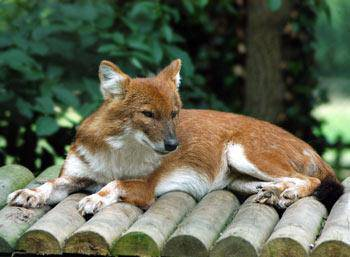

In [101]:
image

In [102]:
#turn image into tensor
tf.constant(image)[:2] #GPU will find paterns faster for a tensor than a simple numpy image

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)>

let's make our function to preprocess the image

In [103]:
# Define image size
IMG_SIZE = 224

def process_image(image_path):
  """
  Takes an image file path and turns it into a Tensor.
  """
  # Read in image file
  image = tf.io.read_file(image_path)
  # Turn the jpeg image into numerical Tensor with 3 colour channels (Red, Green, Blue)
  image = tf.image.decode_jpeg(image, channels=3)
  # Convert the colour channel values from 0-225 values to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to our desired size (224, 244)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])
  return image

### Creating data batches

Wonderful. Now we've got a function to convert our images into Tensors, we'll now build one to turn our data into batches (more specifically, a TensorFlow [`BatchDataset`](https://www.tensorflow.org/guide/data#batching_dataset_elements)).

What's a batch?

A batch (also called mini-batch) is a small portion of your data, say 32 (32 is generally the default batch size) images and their labels. In deep learning, instead of finding patterns in an entire dataset at the same time, you often find them one batch at a time.

Let's say you're dealing with 10,000+ images (which we are). Together, these files may take up more memory than your GPU has. Trying to compute on them all would result in an error.

Instead, it's more efficient to create smaller batches of your data and compute on one batch at a time.

TensorFlow is very efficient when your data is in batches of (image, label) Tensors. So we'll build a function to do create those first. We'll take advantage of of `process_image` function at the same time.

In [104]:
#create a function to return a tuple of tensors
def get_image_label(image_path,label):
  """
  Take an image file path name and label,
  process th image and return a tuple of (image label),
  """
  image= process_image(image_path)
  return image,label

In [105]:
(process_image(X[41]),tf.constant(y[41]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[2.42043078e-01, 1.98905826e-01, 8.91018882e-02],
         [2.26041675e-01, 1.82904422e-01, 7.31004924e-02],
         [2.17323199e-01, 1.69634104e-01, 6.76733181e-02],
         ...,
         [2.41921708e-01, 1.67411894e-01, 1.12509929e-01],
         [2.33289614e-01, 1.58779800e-01, 9.99562740e-02],
         [2.42043138e-01, 1.67533323e-01, 1.08709790e-01]],
 
        [[2.50140756e-01, 2.07003519e-01, 9.71995965e-02],
         [2.36528367e-01, 1.93391114e-01, 8.35871845e-02],
         [2.28168786e-01, 1.80479690e-01, 7.85189122e-02],
         ...,
         [2.35253885e-01, 1.64980754e-01, 1.09448574e-01],
         [2.35250369e-01, 1.68583691e-01, 1.05838597e-01],
         [2.40677595e-01, 1.74010918e-01, 1.11265816e-01]],
 
        [[2.56407589e-01, 2.13270321e-01, 1.03466392e-01],
         [2.43093491e-01, 1.99956238e-01, 9.01523158e-02],
         [2.38611713e-01, 1.90922633e-01, 8.89618397e-02],
         ...,
         [2

In [106]:
# Define the batch size, 32 is a good default
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(x, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Creates batches of data out of image (x) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle it if it's validation data.
  Also accepts test data as input (no labels).
  """
  # If the data is a test dataset, we probably don't have labels
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x))) # only filepaths, use x instead of X
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # If the data if a valid dataset, we don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x), # filepaths, use x instead of X
                                               tf.constant(y))) # labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    # If the data is a training dataset, we shuffle it
    print("Creating training data batches...")
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x), # filepaths, use x instead of X
                                              tf.constant(y))) # labels

    # Shuffling pathnames and labels before mapping image processor function is faster than shuffling images
    data = data.shuffle(buffer_size=len(x)) # use x instead of X

    # Create (image, label) tuples (this also turns the image path into a preprocessed image)
    data = data.map(get_image_label)

    # Turn the data into batches
    data_batch = data.batch(BATCH_SIZE)
  return data_batch

In [107]:
#create training and validation data batches
train_data= create_data_batches(X_train,y_train)
val_data= create_data_batches(X_val,y_val,valid_data=True)

Creating training data batches...
Creating validation data batches...


In [108]:
# Check out the different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

Visualising Data Batches

In [109]:
import matplotlib.pyplot as plt
# Create a function for viewing images in a data batch
def show_25_images(images, labels):
  """
  Displays 25 images from a data batch.
  """
  # Setup the figure
  plt.figure(figsize=(10, 10))
  # Loop through 25 (for displaying 25 images)
  for i in range(25):
    # Create subplots (5 rows, 5 columns)
    ax = plt.subplot(5, 5, i+1)
    # Display an image
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn gird lines off
    plt.axis("off")

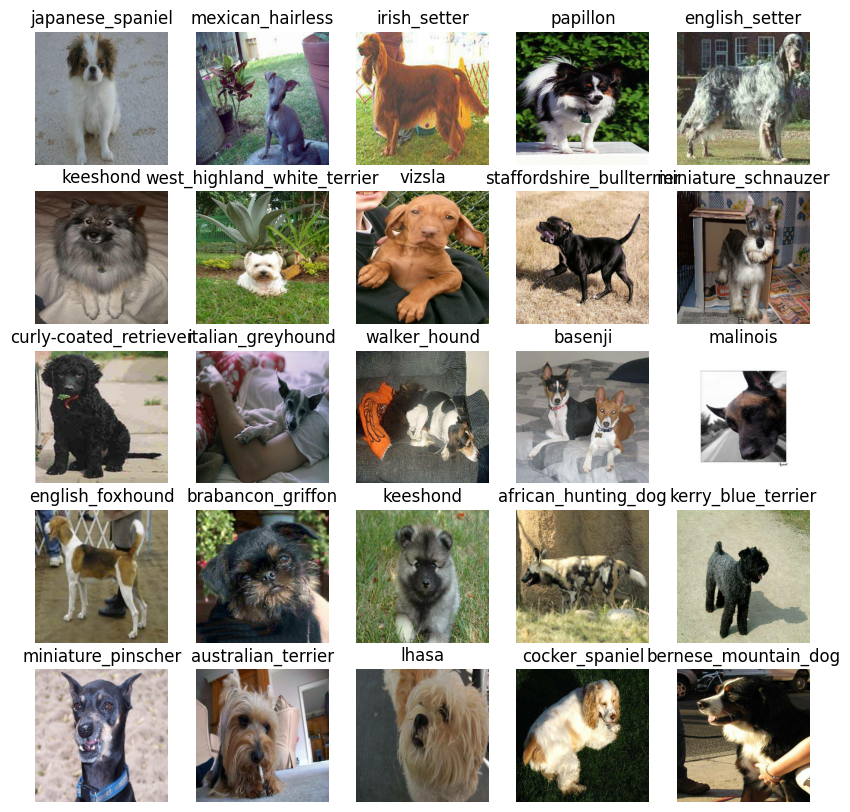

In [110]:
# Visualize training images from the training data batch
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images, train_labels)

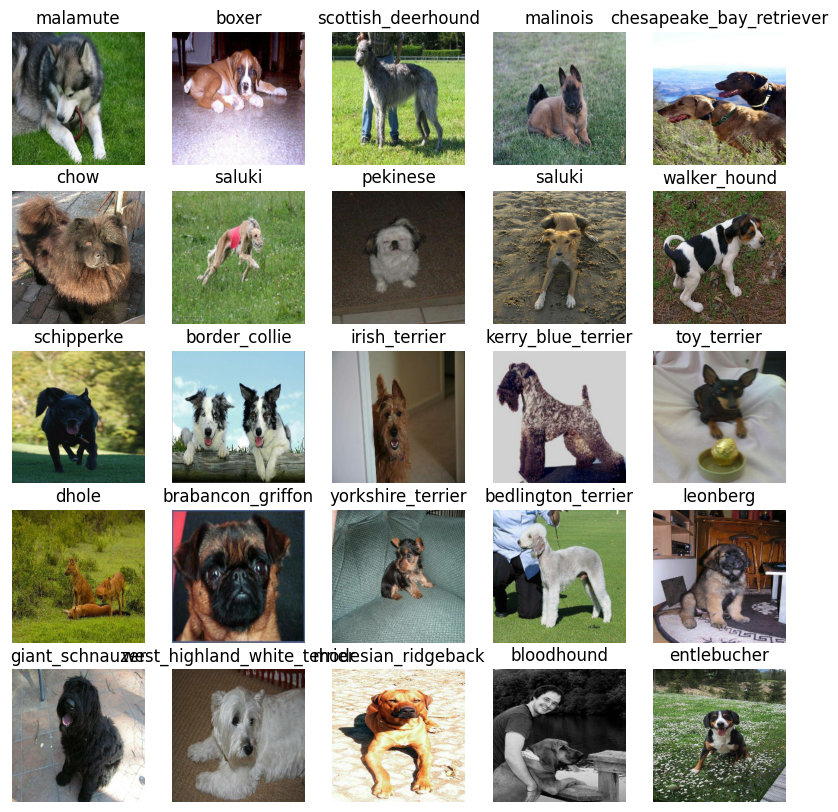

In [111]:
# Visualize validation images from the validation data batch
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

# Creating and training a model

Now our data is ready, let's prepare it modelling. We'll use an existing model from [TensorFlow Hub](https://tfhub.dev/).

TensorFlow Hub is a resource where you can find pretrained machine learning models for the problem you're working on.

Using a pretrained machine learning model is often referred to as **transfer learning**.

#### Why use a pretrained model?

Building a machine learning model and training it on lots from scratch can be expensive and time consuming.

Transfer learning helps eliviate some of these by taking what another model has learned and using that information with your own problem.

#### How do we choose a model?

Since we know our problem is image classification (classifying different dog breeds), we can navigate the [TensorFlow Hub page by our problem domain (image)](https://tfhub.dev/s?module-type=image-augmentation,image-classification,image-feature-vector,image-generator,image-object-detection,image-others,image-style-transfer,image-rnn-agent).

We start by choosing the image problem domain, and then can filter it down by subdomains, in our case, [image classification](https://tfhub.dev/s?module-type=image-classification).

Doing this gives a list of different pretrained models we can apply to our task.

Clicking on one gives us information about the model as well as instructions for using it.

For example, clicking on the [mobilenet_v2_130_224](https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4) model, tells us this model takes an input of images in the shape 224, 224. It also says the model has been trained in the domain of image classification.

Let's try it out.

### Building a model

Before we build a model, there are a few things we need to define:
* The input shape (images, in the form of Tensors) to our model.
* The output shape (image labels, in the form of Tensors) of our model.
* The URL of the model we want to use.

These things will be standard practice with whatever machine learning model you use. And because we're using TensorFlow, everything will be in the form of Tensors.


In [112]:
!pip install tensorflow tensorflow_hub
import tensorflow as tf
import tensorflow_hub as hub

# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, colour channels

# Setup output shape of the model
OUTPUT_SHAPE = len(unique_breeds) # number of unique labels

# Setup model URL from TensorFlow Hub
MODEL_URL = "https://tfhub.dev/google/tf2-preview/mobilenet_v2/classification/4"

In [113]:
import tf_keras

# Create a function which builds a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with:", MODEL_URL)

  # Setup the model layers
  model = tf_keras.Sequential([
    hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
    tf_keras.layers.Dense(units=OUTPUT_SHAPE,
                          activation="softmax") # Layer 2 (output layer)
  ])

  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(), # Our model wants to reduce this (how wrong its guesses are)
      optimizer=tf_keras.optimizers.Adam(), # A friend telling our model how to improve its guesses
      metrics=["accuracy"] # We'd like this to go up
  )

  # Build the model
  model.build(INPUT_SHAPE) # Let the model know what kind of inputs it'll be getting

  return model

In [114]:
# Create a model and check its details
model = create_model()
model.summary()

Building model with: https://tfhub.dev/google/tf2-preview/mobilenet_v2/classification/4
Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer_2 (KerasLayer)  (None, 1001)              3540265   
                                                                 
 dense_2 (Dense)             (None, 120)               120240    
                                                                 
Total params: 3660505 (13.96 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 3540265 (13.51 MB)
_________________________________________________________________


In [115]:
%load_ext tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [116]:
import datetime

# Create a function to build a TensorBoard callback
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs
  log_dir = os.path.join("drive/My Drive/Data/logs",
                        # Make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf_keras.callbacks.TensorBoard(log_dir)

#### Early Stopping Callback

[Early stopping](https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping) helps prevent overfitting by stopping a model when a certain evaluation metric stops improving. If a model trains for too long, it can do so well at finding patterns in a certain dataset that it's not able to use those patterns on another dataset it hasn't seen before (doesn't generalize).

It's basically like saying to our model, "keep finding patterns until the quality of those patterns starts to go down."



In [117]:
# Create early stopping (once our model stops improving, stop training)
early_stopping = tf_keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3) # stops after 3 rounds of no improvements

### Training a model (on a subset of data)
Our first model is only going to be trained on 1000 images. Or trained on 800 images and then validated on 200 images, meaning 1000 images total or about 10% of the total data.

We do this to make sure everything is working. And if it is, we can step it up later and train on the entire training dataset.

The final parameter we'll define before training is `NUM_EPOCHS` (also known as **number of epochs**).

`NUM_EPOCHS` defines how many passes of the data we'd like our model to do. A pass is equivalent to our model trying to find patterns in each dog image and see which patterns relate to each label.

If `NUM_EPOCHS=1`, the model will only look at the data once and will probably score badly because it hasn't a chance to correct itself. It would be like you competing in the international hill descent championships and your friend Adam only being able to give you 1 single instruction to get down the hill.

What's a good value for `NUM_EPOCHS`?

This one is hard to say. 10 could be a good start but so could 100. This is one of the reasons we created an early stopping callback. Having early stopping setup means if we set `NUM_EPOCHS` to 100 but our model stops improving after 22 epochs, it'll stop training.

Along with this, let's quickly check if we're still using a GPU.

In [118]:
# How many rounds should we get the model to look through the data?
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100, step:10}

Boom! We've got a GPU running and `NUM_EPOCHS` setup. Let's create a simple function which trains a model. The function will:
* Create a model using `create_model()`.
* Setup a TensorBoard callback using `create_tensorboard_callback()` (we do this here so it creates a log directory of the current date and time).
* Call the `fit()` function on our model passing it the training data, validatation data, number of epochs to train for and the callbacks we'd like to use.
* Return the fitted model.

In [119]:
# Build a function to train and return a trained model

class CustomTensorBoard(tf_keras.callbacks.TensorBoard):
    def __init__(self, *args, **kwargs):
        super(CustomTensorBoard, self).__init__(*args, **kwargs)
        self._supports_tf_logs = True
    def _implements_test_batch_hooks(self):
        # Indicate that this callback implements test batch hooks
        return True
    def _batch_hooks_support_tf_logs(self):
        # Assuming self.callbacks is defined in CustomTensorBoard or its parent class
        return all(
            getattr(cb, "_supports_tf_logs", False)
            for cb in self    )

def train_model():
  """
  Trains a given model and returns the trained version.
  """
  # Create a model
  model = create_model()

  # Create new TensorBoard session everytime we train a model
  log_dir = os.path.join("drive/My Drive/Data/logs",
                        # Make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1, # check validation metrics every epoch
            callbacks=[tensorboard, early_stopping])

  return model

In [120]:
model = train_model()

Building model with: https://tfhub.dev/google/tf2-preview/mobilenet_v2/classification/4
Epoch 1/100
25/25 [==============================] - 13s 229ms/step - loss: 4.7297 - accuracy: 0.0850 - val_loss: 3.3715 - val_accuracy: 0.2750
Epoch 2/100
25/25 [==============================] - 2s 80ms/step - loss: 1.6178 - accuracy: 0.6900 - val_loss: 2.0183 - val_accuracy: 0.5250
Epoch 3/100
25/25 [==============================] - 2s 87ms/step - loss: 0.5327 - accuracy: 0.9362 - val_loss: 1.5411 - val_accuracy: 0.6100
Epoch 4/100
25/25 [==============================] - 2s 96ms/step - loss: 0.2299 - accuracy: 0.9912 - val_loss: 1.4030 - val_accuracy: 0.6300
Epoch 5/100
25/25 [==============================] - 3s 129ms/step - loss: 0.1354 - accuracy: 0.9975 - val_loss: 1.3368 - val_accuracy: 0.6450
Epoch 6/100
25/25 [==============================] - 3s 112ms/step - loss: 0.0916 - accuracy: 1.0000 - val_loss: 1.2977 - val_accuracy: 0.6450
Epoch 7/100
25/25 [==============================] - 4s 

## Making and evaluating predictions using a trained model

Before we scale up and train on more data, let's see some other ways we can evaluate our model. Because although accuracy is a pretty good indicator of how our model is doing, it would be even better if we could could see it in action.

Making predictions with a trained model is as calling `predict()` on it and passing it data in the same format the model was trained on.

In [121]:
predictions = model.predict(val_data, verbose=1) # verbose shows us how long there is to go
predictions

7/7 [==============================] - 5s 145ms/step


array([[1.71824431e-04, 1.74523608e-04, 6.87620952e-04, ...,
        4.34969843e-04, 1.90484105e-03, 1.72734808e-03],
       [1.07348988e-05, 4.51002852e-04, 1.06375788e-04, ...,
        5.57524501e-04, 3.80072714e-04, 1.17974654e-04],
       [3.89722339e-03, 3.34549136e-03, 2.30021076e-03, ...,
        5.85353933e-03, 1.40947464e-04, 3.84212653e-05],
       ...,
       [3.21345171e-03, 3.95783309e-06, 1.52171797e-05, ...,
        9.22994036e-03, 2.41959657e-04, 3.58234043e-03],
       [6.45720684e-06, 5.47387972e-05, 6.58850622e-05, ...,
        2.41104208e-04, 5.26906515e-04, 3.87287764e-06],
       [2.31252161e-05, 3.28021473e-04, 1.29084234e-04, ...,
        1.97923859e-03, 6.41116232e-04, 1.06930122e-04]], dtype=float32)

In [122]:
# Check the shape of predictions
predictions.shape

(200, 120)

In [123]:
print(predictions[0])
print(f"Max value (probability of prediction): {np.max(predictions[0])}") # the max probability value predicted by the model
print(f"Sum: {np.sum(predictions[0])}") # because we used softmax activation in our model, this will be close to 1
print(f"Max index: {np.argmax(predictions[0])}") # the index of where the max value in predictions[0] occurs
print(f"Predicted label: {unique_breeds[np.argmax(predictions[0])]}") # the predicted label

[1.7182443e-04 1.7452361e-04 6.8762095e-04 6.9857029e-05 2.0097585e-04
 1.8888434e-04 1.5070825e-04 1.7271454e-04 1.3531468e-05 5.4839515e-04
 7.9785546e-05 1.0722337e-03 3.0351788e-04 1.2131328e-04 5.4594706e-04
 1.1065850e-04 2.0586452e-03 7.1705879e-05 8.5894606e-04 4.6761279e-04
 4.8658636e-04 3.5522031e-04 2.0544797e-04 1.4730431e-04 5.9473427e-04
 4.7902134e-04 2.7802991e-04 6.6114875e-04 2.4519119e-04 7.0185447e-04
 1.0267334e-03 3.1470638e-05 6.3061982e-04 1.6617481e-04 9.0233494e-05
 1.1920344e-04 6.5626425e-04 2.2397141e-03 4.7637059e-04 1.6630512e-04
 1.5510022e-04 3.4797553e-04 3.1635072e-04 6.9772117e-02 3.0893509e-04
 1.0557900e-03 5.4336423e-03 1.0221118e-04 4.7395148e-04 1.3326861e-04
 2.3006622e-04 5.4973096e-04 2.7079484e-04 2.8115610e-05 2.2999221e-03
 9.5148326e-04 2.3676701e-04 5.6770477e-06 7.9926779e-04 7.3635939e-04
 5.7428941e-04 2.3957931e-03 7.0450469e-03 1.5612866e-04 2.5082866e-04
 9.4028958e-04 2.5951201e-03 1.3458503e-03 1.9459454e-04 1.6918951e-03
 1.063

In [124]:
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[0])
pred_label

'malamute'

In [125]:
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[26])
pred_label

'welsh_springer_spaniel'

Wonderful! Now we've got a list of all different predictions our model has made, we'll do the same for the validation images and validation labels.

Remember, the model hasn't trained on the validation data, during the `fit()` function, it only used the validation data to evaluate itself. So we can use the validation images to visually compare our models predictions with the validation labels.

Since our validation data (`val_data`) is in batch form, to get a list of validation images and labels, we'll have to unbatch it (using [`unbatch()`](https://www.tensorflow.org/api_docs/python/tf/data/Dataset#unbatch)) and then turn it into an iterator using [`as_numpy_iterator()`](https://www.tensorflow.org/api_docs/python/tf/data/Dataset#as_numpy_iterator).

Let's make a small function to do so.

In [126]:
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors and returns separate arrays
  of images and labels.
  """
  images = []
  labels = []
  # Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.13251519, 0.1442799 , 0.17957403],
         [0.12505971, 0.13682443, 0.17211854],
         [0.13492085, 0.14668556, 0.18197967],
         ...,
         [0.19382642, 0.3350029 , 0.09186564],
         [0.1553221 , 0.29649857, 0.05336132],
         [0.14208674, 0.2832632 , 0.04012595]],
 
        [[0.148918  , 0.16068271, 0.19597684],
         [0.13931666, 0.15108137, 0.1863755 ],
         [0.14735614, 0.15912084, 0.19441497],
         ...,
         [0.14635983, 0.28753632, 0.04439905],
         [0.15234591, 0.2935224 , 0.04471286],
         [0.14317565, 0.28435212, 0.03554259]],
 
        [[0.18249895, 0.19426367, 0.22955778],
         [0.1576687 , 0.1694334 , 0.20472753],
         [0.14911401, 0.16087872, 0.19617285],
         ...,
         [0.11751765, 0.2586941 , 0.01555686],
         [0.1537465 , 0.29620132, 0.04114139],
         [0.15335536, 0.2965336 , 0.03892949]],
 
        ...,
 
        [[0.2434762 , 0.41210365, 0.14246139],
         [0.18669055, 0.35531804, 0.07849

In [127]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth label and image for sample n.
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the color of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  plt.title("{} {:2.0f}% ({})".format(pred_label,
                                      np.max(pred_prob)*100,
                                      true_label),
                                      color=color)

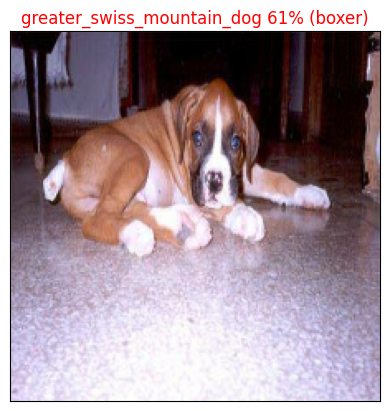

In [128]:
# View an example prediction, original image and truth label
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images)

Nice! Making functions to help visual your models results are really helpful in understanding how your model is doing.

Since we're working with a multi-class problem (120 different dog breeds), it would also be good to see what other guesses our model is making. More specifically, if our model predicts a certain label with 24% probability, what else did it predict?

Let's build a function to demonstrate. The function will:
* Take an input of a prediction probabilities array, a ground truth labels array and an integer.
* Find the predicted label using `get_pred_label()`.
* Find the top 10:
  * Prediction probabilities indexes
  * Prediction probabilities values
  * Prediction labels
* Plot the top 10 prediction probability values and labels, coloring the true label green.

In [129]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plots the top 10 highest prediction confidences along with
  the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")

  # Change color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

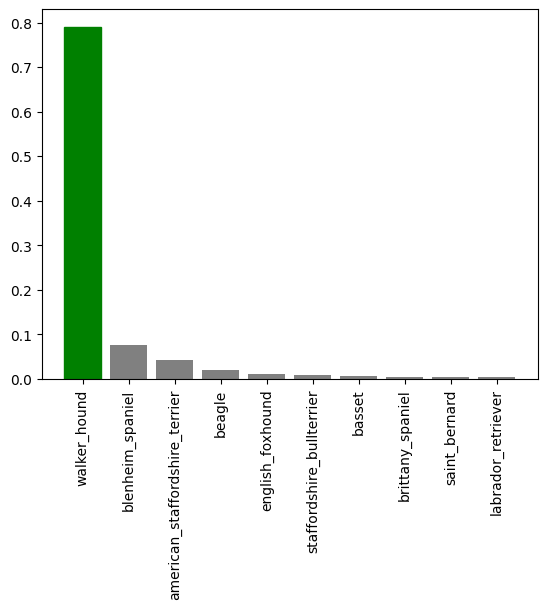

In [130]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=9)

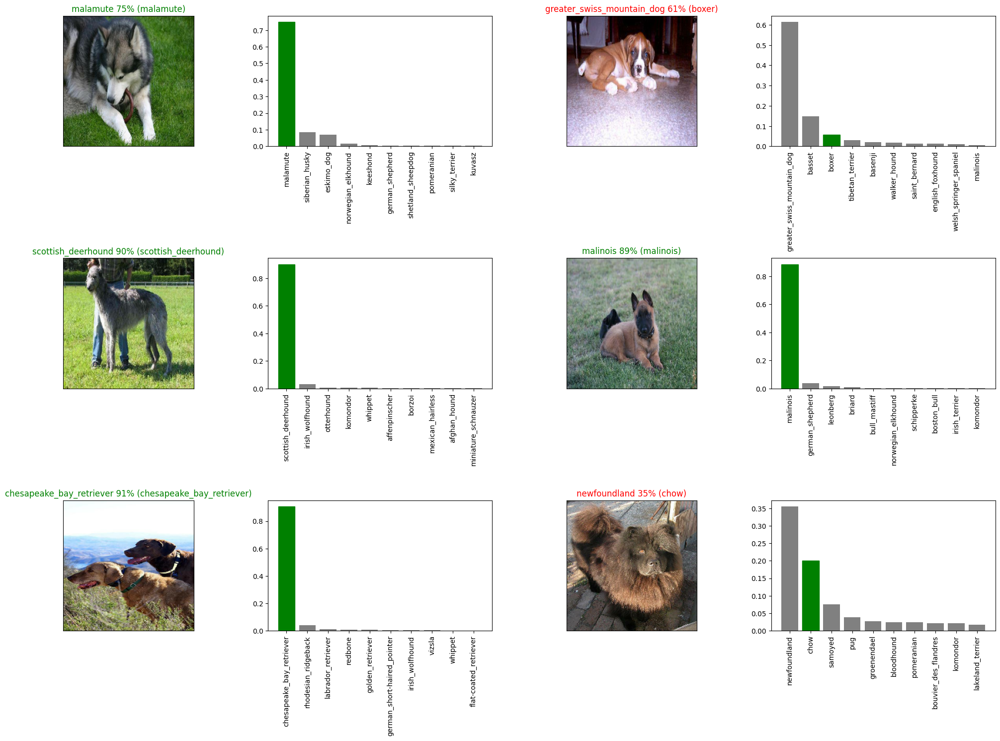

In [131]:
# Let's check a few predictions and their different values
i_multiplier = 0
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(5*2*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                labels=val_labels,
                n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

## Saving and reloading a model

After training a model, it's a good idea to save it. Saving it means you can share it with colleagues, put it in an application and more importantly, won't have to go through the potentially expensive step of retraining it.

The format of an [entire saved Keras model is h5](https://www.tensorflow.org/tutorials/keras/save_and_load). So we'll make a function which can take a model as input and utilise the [`save()`](https://www.tensorflow.org/tutorials/keras/save_and_load#savedmodel_format) method to save it as a h5 file to a specified directory.

In [132]:
def save_model(model, suffix=None):
  """
  Saves a given model in a models directory and appends a suffix (str)
  for clarity and reuse.
  """
  # Create model directory with current time
  modeldir = os.path.join("drive/My Drive/Data/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5" # save format of model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

If we've got a saved model, we'd like to load it, let's create a function which can take a model path and use the [`tf.keras.models.load_model()`](https://www.tensorflow.org/api_docs/python/tf/keras/models/load_model) function to load it into the notebook.

Because we're using a component from TensorFlow Hub (`hub.KerasLayer`) we'll have to pass this as a parameter to the `custom_objects` parameter.

In [133]:
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from: {model_path}")
  model = tf_keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model

In [134]:
# Save our model trained on 1000 images
save_model(model, suffix="1000-images-Adam")

Saving model to: drive/My Drive/Data/models/20241105-07381730792298-1000-images-Adam.h5...


/usr/local/lib/python3.10/dist-packages/tf_keras/src/engine/training.py:3098: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native TF-Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'drive/My Drive/Data/models/20241105-07381730792298-1000-images-Adam.h5'

In [136]:
# Load our model trained on 1000 images
model_1000_images = load_model('/content/drive/My Drive/Data/models/20241105-06531730789637-1000-images-Adam.h5')

Loading saved model from: /content/drive/My Drive/Data/models/20241105-06531730789637-1000-images-Adam.h5


In [137]:
model.evaluate(val_data)

7/7 [==============================] - 0s 51ms/step - loss: 1.1883 - accuracy: 0.6700


[1.1883102655410767, 0.6700000166893005]

In [138]:
model_1000_images.evaluate(val_data)

7/7 [==============================] - 1s 52ms/step - loss: 1.1939 - accuracy: 0.6750


[1.1938530206680298, 0.675000011920929]

## Training a model (on the full data)

Now we know our model works on a subset of the data, we can start to move forward with training one on the full data.

Above, we saved all of the training filepaths to `X` and all of the training labels to `y`. Let's check them out.

In [139]:
len(X),len(y)

(10222, 10222)

There we go! We've got over 10,000 images and labels in our training set.

Before we can train a model on these, we'll have to turn them into a data batch.

The beautiful thing is, we can use our `create_data_batches()` function from above which also preprocesses our images for us (thank you past us for writing a helpful function).

In [140]:
full_data= create_data_batches(X,y)

Creating training data batches...


In [141]:
full_model = create_model()

Building model with: https://tfhub.dev/google/tf2-preview/mobilenet_v2/classification/4


Since we've made a new model instance, full_model, we'll need some callbacks too

In [142]:
# Create full model callbacks

# TensorBoard callback
full_model_tensorboard = create_tensorboard_callback()

# Early stopping callback
# Note: No validation set when training on all the data, therefore can't monitor validation accruacy
full_model_early_stopping = tf_keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience=3)

In [143]:
%tensorboard --logdir drive/My\ Drive/Data/logs

<IPython.core.display.Javascript object>

**Note:** Since running the cell below will cause the model to train on all of the data (10,000+) images, it may take a fairly long time to get started and finish. However, thanks to our `full_model_early_stopping` callback, it'll stop before it starts going too long.

Remember, the first epoch is always the longest as data gets loaded into memory. After it's there, it'll speed up.

In [144]:
# Fit the full model to the full training data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard,
                          full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 26s 69ms/step - loss: 1.2889 - accuracy: 0.6780
Epoch 2/100
320/320 [==============================] - 21s 65ms/step - loss: 0.3725 - accuracy: 0.8910
Epoch 3/100
320/320 [==============================] - 20s 62ms/step - loss: 0.2186 - accuracy: 0.9411
Epoch 4/100
320/320 [==============================] - 22s 69ms/step - loss: 0.1416 - accuracy: 0.9664
Epoch 5/100
320/320 [==============================] - 22s 68ms/step - loss: 0.0968 - accuracy: 0.9808
Epoch 6/100
320/320 [==============================] - 23s 73ms/step - loss: 0.0714 - accuracy: 0.9873
Epoch 7/100
320/320 [==============================] - 21s 64ms/step - loss: 0.0523 - accuracy: 0.9938
Epoch 8/100
320/320 [==============================] - 20s 64ms/step - loss: 0.0424 - accuracy: 0.9949
Epoch 9/100
320/320 [==============================] - 22s 67ms/step - loss: 0.0340 - accuracy: 0.9969
Epoch 10/100
320/320 [==============================] - 23s 70ms/step - l

### Saving and reloading the full model

Even on a GPU, our full model took a while to train. So it's a good idea to save it.

We can do so using our `save_model()` function.

**Challenge:** It may be a good idea to incorporate the `save_model()` function into a `train_model()` function. Or look into setting up a [checkpoint callback](https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/ModelCheckpoint).

In [145]:
save_model(full_model, suffix="all-images-Adam")

Saving model to: drive/My Drive/Data/models/20241105-07501730793011-all-images-Adam.h5...


/usr/local/lib/python3.10/dist-packages/tf_keras/src/engine/training.py:3098: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native TF-Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'drive/My Drive/Data/models/20241105-07501730793011-all-images-Adam.h5'

In [147]:
loaded_full_model = load_model('/content/drive/My Drive/Data/models/20241105-07501730793011-all-images-Adam.h5')

Loading saved model from: /content/drive/My Drive/Data/models/20241105-07501730793011-all-images-Adam.h5


### Making predictions on the test dataset

Since our model has been trained on images in the form of Tensor batches, to make predictions on the test data, we'll have to get it into the same format.

Luckily we created `create_data_batches()` earlier which can take a list of filenames as input and convert them into Tensor batches.

To make predictions on the test data, we'll:
* Get the test image filenames.
* Convert the filenames into test data batches using `create_data_batches()` and setting the `test_data` parameter to `True` (since there are no labels with the test images).
* Make a predictions array by passing the test data batches to the `predict()` function.

In [148]:
test_path = "/content/Dog Vision/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]

test_filenames[:10]

['/content/Dog Vision/test/39cc7e1bcef4b568e1f2926a2932f141.jpg',
 '/content/Dog Vision/test/43f006f3b66d097dadead3d13caebe2f.jpg',
 '/content/Dog Vision/test/10c4c824396380cbc41c36f28b1b9baf.jpg',
 '/content/Dog Vision/test/9a5d178c8e74fcd1363759ff679989ae.jpg',
 '/content/Dog Vision/test/4ae92c29dd23f08ee3ba8fa41e3539f5.jpg',
 '/content/Dog Vision/test/c64cbe07283cda7eb1446d4c26d3ac87.jpg',
 '/content/Dog Vision/test/98f32906b7bf0e7c8eb50627363e7f6a.jpg',
 '/content/Dog Vision/test/e021107c3f07749e5f5b389e57e21ded.jpg',
 '/content/Dog Vision/test/03cd468831ad32cd337a73a7bde9dafa.jpg',
 '/content/Dog Vision/test/b0c864376089659dfb024637a7541a47.jpg']

In [149]:
len(test_filenames)

10357

In [150]:
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches...


In [151]:
# Make predictions on test data batch using the loaded full model
test_predictions = loaded_full_model.predict(test_data,
                                             verbose=1)

324/324 [==============================] - 23s 69ms/step


In [152]:
test_predictions[:10]

array([[2.5728118e-13, 3.1366693e-13, 4.1957088e-10, ..., 3.1582953e-08,
        2.1184472e-04, 1.1890824e-08],
       [1.1256100e-11, 2.2706596e-05, 7.8963107e-11, ..., 1.0249226e-11,
        8.0429916e-12, 1.7054169e-09],
       [7.0215731e-07, 9.0203116e-08, 6.6342526e-10, ..., 1.6097613e-09,
        2.1218880e-09, 8.7692236e-08],
       ...,
       [4.2882347e-09, 5.7259236e-10, 2.0279238e-08, ..., 5.0378716e-08,
        7.0030849e-11, 2.3166397e-10],
       [5.9450822e-09, 1.5799615e-07, 6.1934258e-09, ..., 9.3563729e-05,
        3.7072418e-08, 4.8177770e-07],
       [2.2941133e-09, 8.8679195e-07, 5.6153386e-08, ..., 5.8295532e-06,
        6.0057442e-07, 2.8033807e-07]], dtype=float32)

### Preparing test dataset predictions for Kaggle

Looking at the [Kaggle sample submission](https://www.kaggle.com/c/dog-breed-identification/overview/evaluation), it looks like they want the models output probabilities each for label along with the image ID's.

To get the data in this format, we'll:
*   Create a pandas DataFrame with an ID column as well as a column for each dog breed.
*   Add data to the ID column by extracting the test image ID's from their filepaths.
* Add data (the prediction probabilities) to each of the dog breed columns using the `unique_breeds` list and the `test_predictions` list.
* Export the DataFrame as a CSV to submit it to Kaggle.


In [153]:
# Create pandas DataFrame with empty columns
preds_df = pd.DataFrame(columns=["id"] + list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [154]:
# Add the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,NaN,2.572812e-13,3.136669e-13,4.195709e-10,2.677235e-10,3.359523e-10,4.956091e-07,3.817436e-08,7.204186e-04,8.388885e-12,...,4.307312e-12,9.986073e-01,1.126352e-10,2.979922e-07,2.044905e-12,4.800601e-12,1.295705e-06,3.158295e-08,2.118447e-04,1.189082e-08
1,NaN,1.125610e-11,2.270660e-05,7.896311e-11,3.810863e-10,2.169414e-14,1.857365e-11,1.228080e-13,5.679531e-11,1.018795e-11,...,1.896114e-13,2.906532e-14,3.828021e-13,4.535101e-11,5.065156e-13,1.752282e-09,2.960731e-12,1.024923e-11,8.042992e-12,1.705417e-09
2,NaN,7.021573e-07,9.020312e-08,6.634253e-10,4.908428e-10,2.553445e-08,5.773828e-11,2.615370e-08,2.477029e-11,1.640287e-09,...,1.158982e-08,1.437149e-10,2.664186e-09,5.639292e-11,3.937948e-08,1.100883e-11,2.840589e-11,1.609761e-09,2.121888e-09,8.769224e-08
3,NaN,3.456424e-13,1.480317e-12,6.209456e-12,4.555199e-07,6.907063e-10,4.996417e-09,4.997220e-12,6.256314e-10,2.784266e-11,...,9.254013e-10,3.913140e-09,2.368434e-12,7.326094e-12,2.365750e-10,1.846387e-11,2.045862e-08,2.355971e-09,8.233868e-01,3.102353e-08
4,NaN,1.030060e-11,2.372081e-11,5.731005e-08,7.982558e-11,1.252018e-04,1.360093e-13,6.695429e-13,1.485127e-05,2.422157e-08,...,9.600057e-13,1.416952e-06,2.984362e-14,7.004916e-09,1.728790e-08,3.871990e-12,6.324822e-08,3.146530e-09,1.658908e-09,2.406864e-10


In [155]:
preds_df.to_csv("drive/My Drive/Data/full_submission_1_mobilienetV2_adam.csv",
                 index=False)

## Making predictions on custom images

It's great being able to make predictions on a test dataset already provided for us.

But how could we use our model on our own images?

The premise remains, if we want to make predictions on our own custom images, we have to pass them to the model in the same format the model was trained on.

To do so, we'll:
* Get the filepaths of our own images.
* Turn the filepaths into data batches using `create_data_batches()`. And since our custom images won't have labels, we set the `test_data` parameter to `True`.
* Pass the custom image data batch to our model's `predict()` method.
* Convert the prediction output probabilities to prediction labels.
* Compare the predicted labels to the custom images.

**Note:** To make predictions on custom images, I've uploaded pictures of my own to a directory located at `drive/My Drive/Data/dogs/` (as seen in the cell below). In order to make predictions on your own images, you will have to do something similar.

In [156]:
# Get custom image filepaths
custom_path = "drive/My Drive/Data/dogs/"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]

In [157]:
# Turn custom image into batch (set to test data because there are no labels)
custom_data = create_data_batches(custom_image_paths, test_data=True)

Creating test data batches...


In [158]:
# Make predictions on the custom data
custom_preds = loaded_full_model.predict(custom_data)

1/1 [==============================] - 1s 1s/step


In [159]:
# Get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['standard_poodle', 'golden_retriever', 'german_shepherd']

In [160]:
# Get custom images (our unbatchify() function won't work since there aren't labels)
custom_images = []
# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

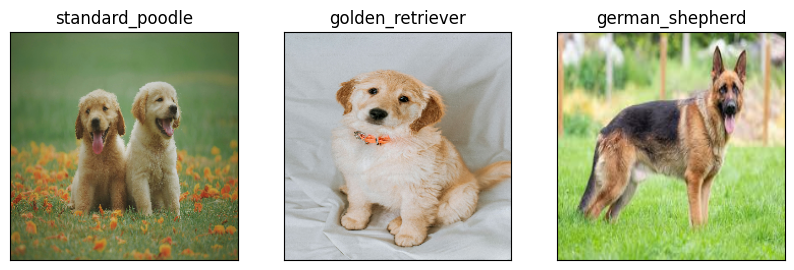

In [161]:
# Check custom image predictions
plt.figure(figsize=(10, 10))
for i, image in enumerate(custom_images):
  plt.subplot(1, 3, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)